# Dimensionality reduction, clustering, visualisation and annotation

In [2]:
# —— RUN THIS BEFORE ANYTHING ELSE ———————————————————————————————
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    from google.colab import drive; drive.mount('/content/drive')
    %run /content/drive/MyDrive/immerge_workshop/codes/notebooks/setup_notebook.py

In [1]:
import warnings
warnings.filterwarnings("ignore")

import gc
import glob as glob_mod
import os
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt
import anndata as ad
import scanpy as sc
# import scvi
import seaborn as sns
from anndata.experimental import concat_on_disk

sc.settings.verbosity = 3
sc.set_figure_params(dpi=100, frameon=False, figsize=(6, 5))
ad.settings.allow_write_nullable_strings = True

In [2]:
IN_DIR = "results/temp/session2_part1/"

In [3]:
OUT_DIR = "results/temp/session2_part2/"
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
adata = sc.read_h5ad(IN_DIR + "adata_s2part1.h5ad")
adata

AnnData object with n_obs × n_vars = 61724 × 30926
    obs: 'n_genes', 'percent_mito', 'doublet_scores', 'senescence_score', 'stress_score_vandenBrink', 'health_score', 'metabolic_activity', 'S_score', 'G2M_score', 'phase', 'sample', 'dataset', 'in_HCAv1', 'exclusion-inclusion_criteria', 'Organ', 'Dataset', 'Sample_id', 'Library_id', 'Donor_id', 'Sex', 'Postnatal_age_years', 'Gestational_age_pcw', 'Developmental_stage', 'Tanner Stage', 'Menstrual_stage', 'Disease', 'Clinical_diagnosis', 'Organ_part', 'Tissue_ROI', 'Specimen_type', 'Sampled_site_condition', 'Observed_pathology', 'Tissue_status', 'Dissociation_method', 'Cell_enrichment', 'Preservation_method', 'Target_cell_population', 'Sorting_method', 'Assay_type', 'Library_chemistry', 'Sequencing_platform', 'Multiplexed', 'Dataset_id', 'Batch', 'Collection_site', 'Sample_id_other', 'Menstrual_stage_OriginalAuthors', 'pct_genes_expressed', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts

In [5]:
print(f"{adata.__sizeof__(with_disk=True) / 1e9:.2f} GB")

3.68 GB


## 0. Subset the data to HVGs

For computational/memory efficiency

In [6]:
# Create a subset of our AnnData that only contains the 3,000 HVGs
adata_hvg = adata[:, adata.var["highly_variable"]].copy()
print(f"HVG object: {adata_hvg.n_obs:,} cells x {adata_hvg.n_vars:,} genes")

HVG object: 61,724 cells x 3,000 genes


# 1. Principal Component Analysis

> *PCA creates new features (called principal components) as linear combinations of the original variables
> (expression of each gene) in a way that maximises variance preservation.*

Two matrices come out:

- **embeddings** — where each cell sits in PC space (`adata.obsm['X_pca']`, cells × PCs)
- **feature loadings** — how much each gene contributes to each PC (`adata.varm['PCs']`, genes × PCs)

In [7]:
# PCA is sensitive to the expression scale of each gene, so we scale here
sc.pp.scale(adata_hvg, max_value=10)

In [8]:
# Perform PCA on the scaled data
sc.tl.pca(adata_hvg, n_comps=50, svd_solver="arpack")

computing PCA
    with n_comps=50
    finished (0:00:25)


In [9]:
adata_hvg

AnnData object with n_obs × n_vars = 61724 × 3000
    obs: 'n_genes', 'percent_mito', 'doublet_scores', 'senescence_score', 'stress_score_vandenBrink', 'health_score', 'metabolic_activity', 'S_score', 'G2M_score', 'phase', 'sample', 'dataset', 'in_HCAv1', 'exclusion-inclusion_criteria', 'Organ', 'Dataset', 'Sample_id', 'Library_id', 'Donor_id', 'Sex', 'Postnatal_age_years', 'Gestational_age_pcw', 'Developmental_stage', 'Tanner Stage', 'Menstrual_stage', 'Disease', 'Clinical_diagnosis', 'Organ_part', 'Tissue_ROI', 'Specimen_type', 'Sampled_site_condition', 'Observed_pathology', 'Tissue_status', 'Dissociation_method', 'Cell_enrichment', 'Preservation_method', 'Target_cell_population', 'Sorting_method', 'Assay_type', 'Library_chemistry', 'Sequencing_platform', 'Multiplexed', 'Dataset_id', 'Batch', 'Collection_site', 'Sample_id_other', 'Menstrual_stage_OriginalAuthors', 'pct_genes_expressed', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_

> ### ✏️ Exercise 1 — the two matrices from the slide
>
> Print the **shape** of the embeddings matrix and of the feature loadings matrix.
>


<details>
<summary><i>Show solution</i></summary>

```python
print("embeddings", adata_hvg.obsm["X_pca"].shape)   # cells x 50
print("loadings  ", adata_hvg.varm["PCs"].shape)     # genes x 50
```

</details>

In [10]:
# PCA only saw the HVG columns; the rest are zero because they were masked out
print("non-zero loading rows:", (np.abs(adata_hvg.varm["PCs"]).sum(axis=1) > 0).sum())

non-zero loading rows: 3000


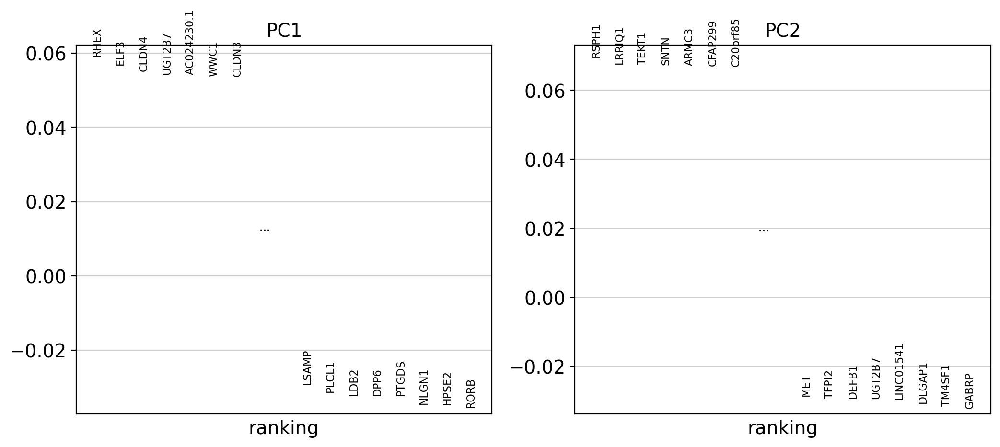

In [12]:
# which genes are driving the first two principal components?
sc.pl.pca_loadings(adata_hvg, components=[1, 2], n_points=15)

# 2. Diagnosing PCs

> *Useful to correlate PCs with known technical variables.*

Careful: a PC that tracks total counts, %mito or doublet score is spending variance on
something you do not want driving the neighbourhood graph.

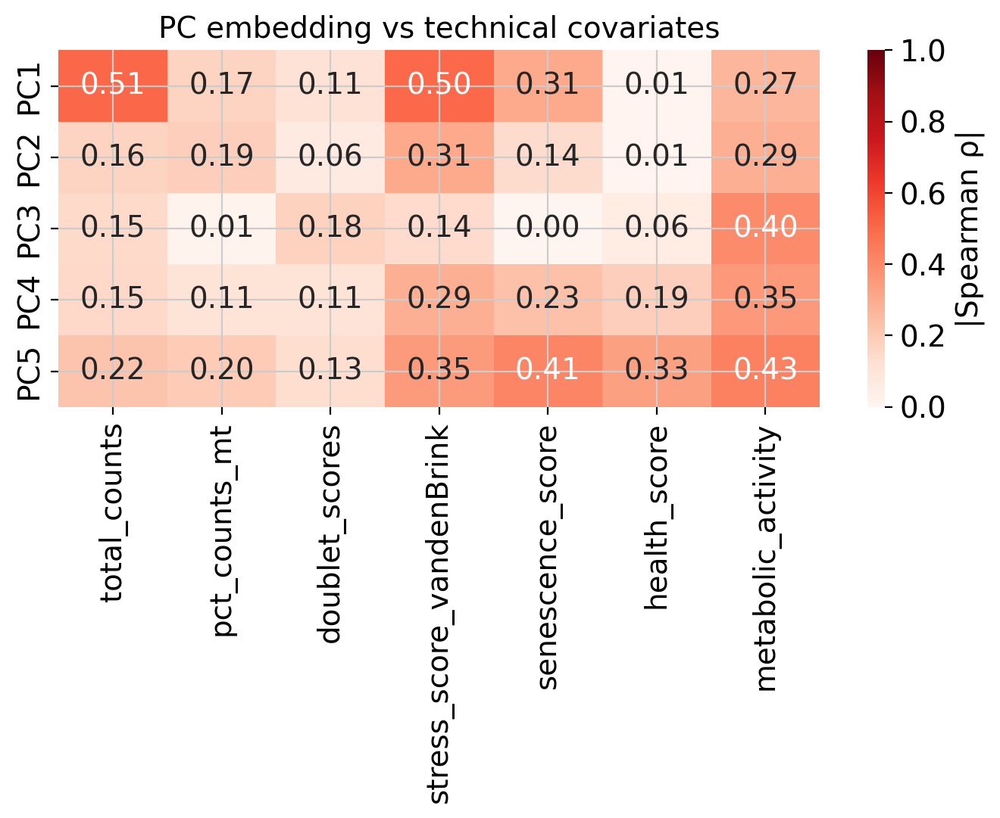

In [13]:
# select technical covariates of interest 
covariates = ["total_counts",  "pct_counts_mt", 
    "doublet_scores", 
    "stress_score_vandenBrink", "senescence_score", "health_score",
    "metabolic_activity"]
# select number of PCs to check
N_CHECK = 5

# correlate covariates of interest with PCs and plot Spearman correlation coefficient in a heatmap
pcs = pd.DataFrame(adata_hvg.obsm["X_pca"][:, :N_CHECK], index=adata_hvg.obs_names,
                   columns=[f"PC{i+1}" for i in range(N_CHECK)])

corr = (pd.concat([pcs, adata_hvg.obs[covariates]], axis=1)
          .corr(method="spearman")
          .loc[pcs.columns, covariates]
          .abs())

fig, ax = plt.subplots(figsize=(1.15 * len(covariates), 0.42 * N_CHECK + 1))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="Reds", vmin=0, vmax=1,
            cbar_kws={"label": "|Spearman ρ|"}, ax=ax)
ax.set_title("PC embedding vs technical covariates")
plt.tight_layout(); plt.show()

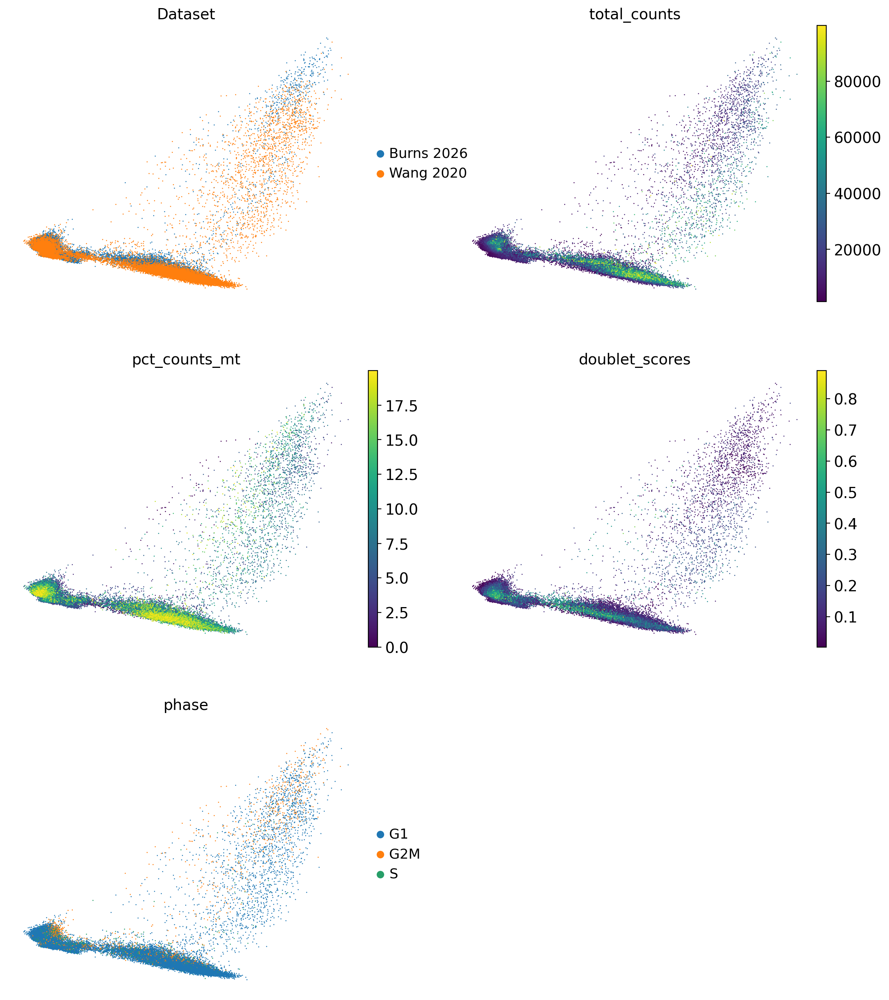

In [14]:
# plot covariates directly in PC space
sc.pl.pca(adata_hvg, color=["Dataset", "total_counts", "pct_counts_mt", "doublet_scores", "phase"], ncols=2, size=4)

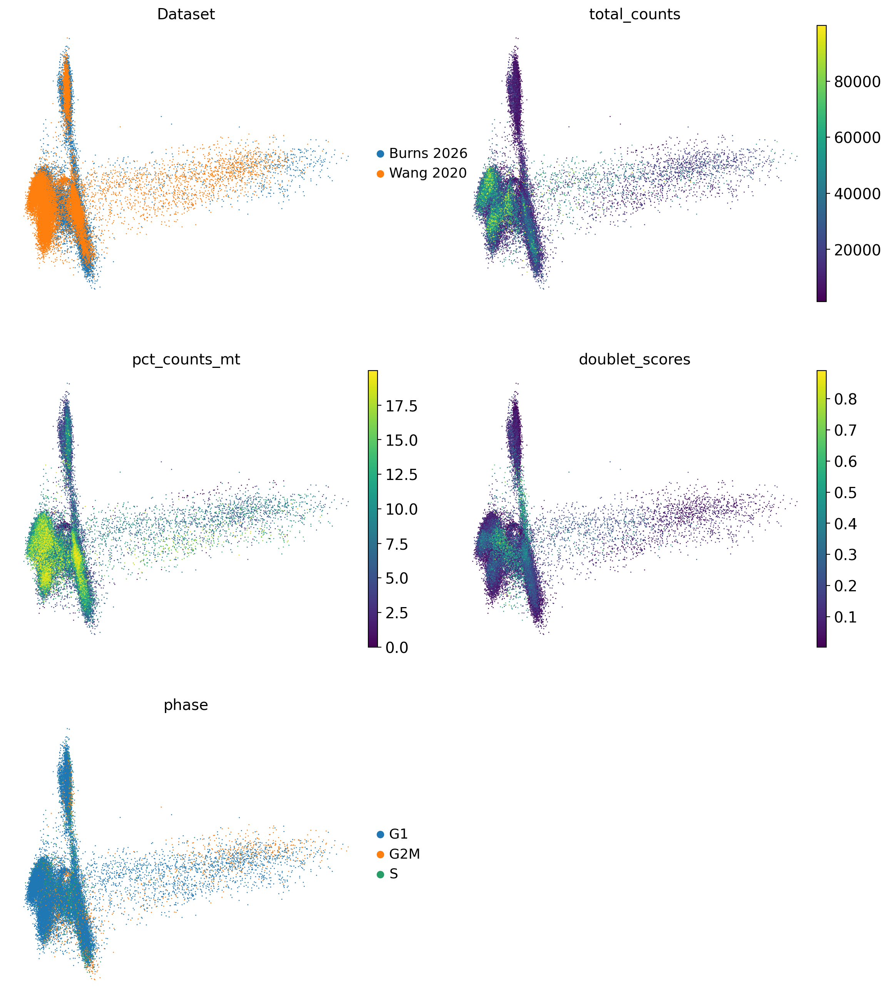

In [15]:
sc.pl.pca(adata_hvg, color=["Dataset", "total_counts", "pct_counts_mt", "doublet_scores", "phase"], ncols=2, size=4, components = ['2,3'])

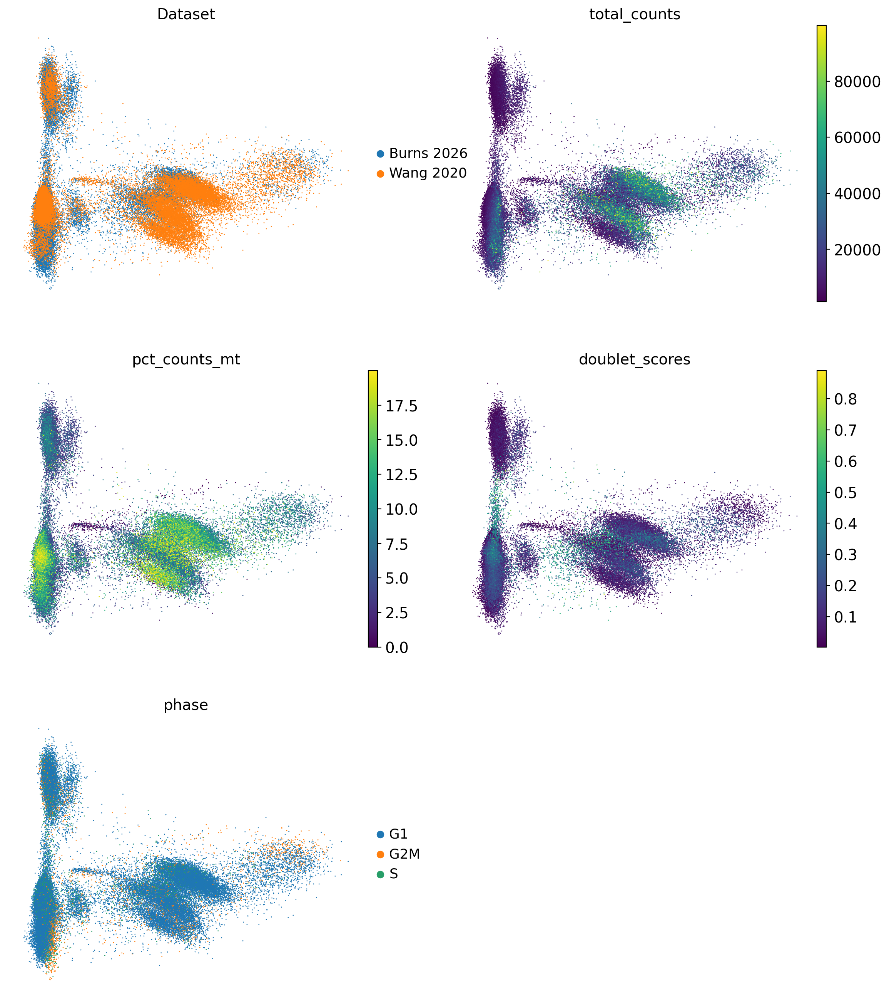

In [16]:
sc.pl.pca(adata_hvg, color=["Dataset", "total_counts", "pct_counts_mt", "doublet_scores", "phase"], ncols=2, size=4, components = ['1,3'])

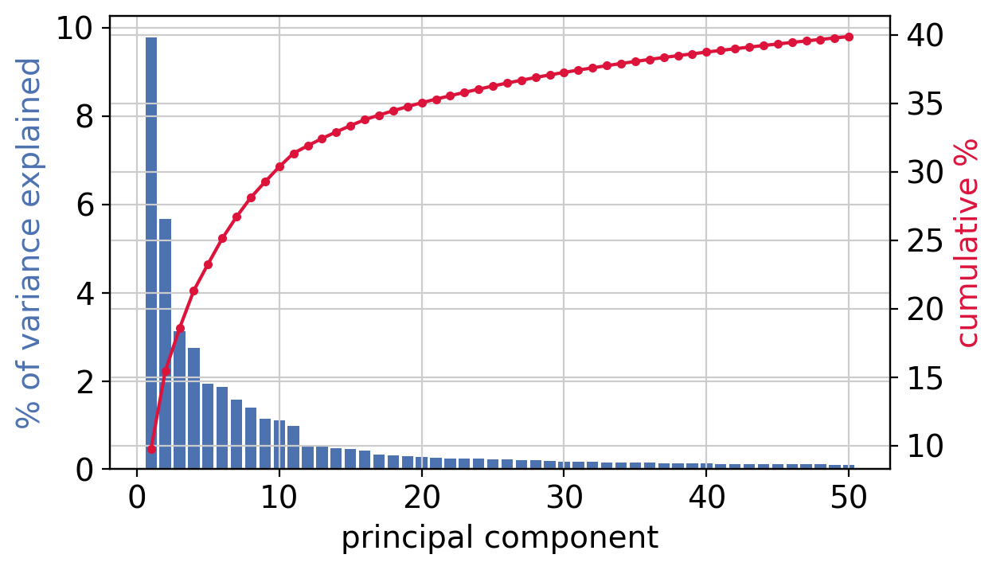

In [17]:
# elbow plot to understand how much each PC contributes to the variance explained
var = adata_hvg.uns["pca"]["variance_ratio"][:50] * 100
pcs = np.arange(1, len(var) + 1)

fig, ax = plt.subplots(figsize=(6.5, 3.8))
ax.bar(pcs, var, color="#4C72B0")
ax.set_xlabel("principal component")
ax.set_ylabel("% of variance explained", color="#4C72B0")

ax2 = ax.twinx()
ax2.plot(pcs, np.cumsum(var), color="crimson", marker="o", ms=3)
ax2.set_ylabel("cumulative %", color="crimson")

plt.tight_layout(); plt.show()

# 3. k-nearest neighbour graph

> *A graph in which two cells p and q are connected by an edge if the distance
> between p and q is among the k-th smallest distances from p to all other cells*
> -> euclidean distance **in principal component space**.

In [18]:
K = 15
sc.pp.neighbors(adata_hvg, n_neighbors=K)

print("distances     ", adata_hvg.obsp["distances"].shape)
print("connectivities", adata_hvg.obsp["connectivities"].shape)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:45)
distances      (61724, 61724)
connectivities (61724, 61724)


In [19]:
# sanity check: how many neighbours does the first cell in the dataset have? 
nbrs = adata_hvg.obsp["distances"][0].nonzero()[1]
print("neighbours stored for cell 0:", len(nbrs))   

# sanity check: which dataset does our first cell come from and which dataset do its k nearest neighbours come from?
own  = adata_hvg.obs["Dataset"].iloc[0]
labs = adata_hvg.obs["Dataset"].iloc[nbrs]
print(f"cell 0 is from {own}; {(labs == own).mean():.0%} of its neighbours are too")

neighbours stored for cell 0: 15
cell 0 is from Burns 2026; 100% of its neighbours are too


# 4. UMAP

UMAP is a **layout of the graph you just built**, so it inherits every upstream
choice: HVGs, number of PCs, k.

In [20]:
# compute umap embedding
sc.tl.umap(adata_hvg)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:16)


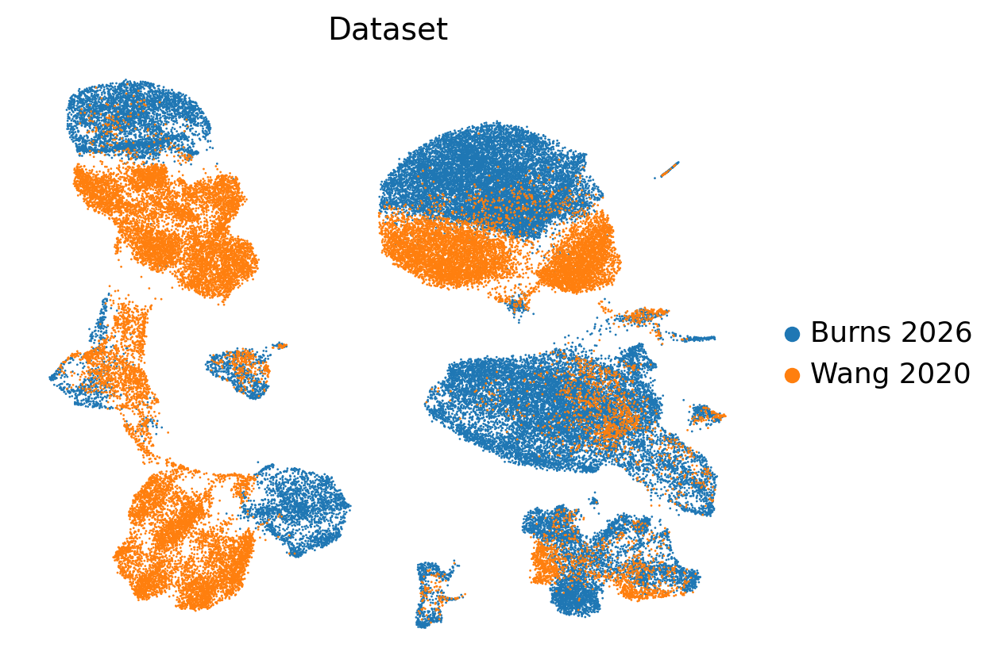

In [21]:
# plot umap embedding and color it by relevant covariates (e.g. "Dataset" --> do you see batch effects?)
sc.pl.umap(adata_hvg, color=["Dataset"], size=4)

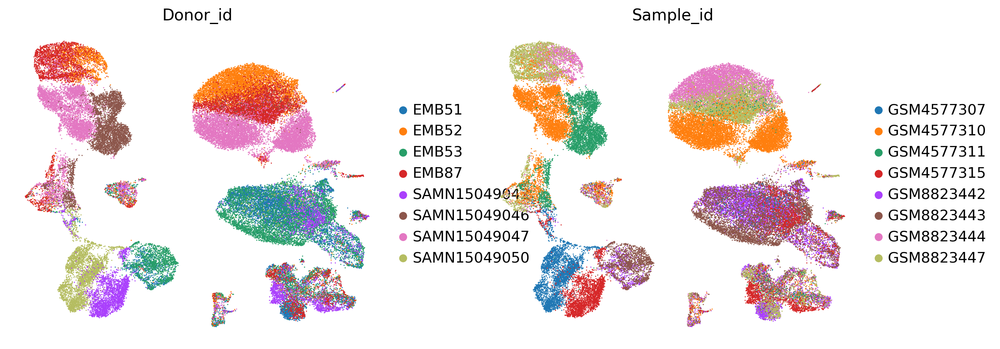

In [22]:
sc.pl.umap(adata_hvg, color=["Donor_id", "Sample_id"], size=4)

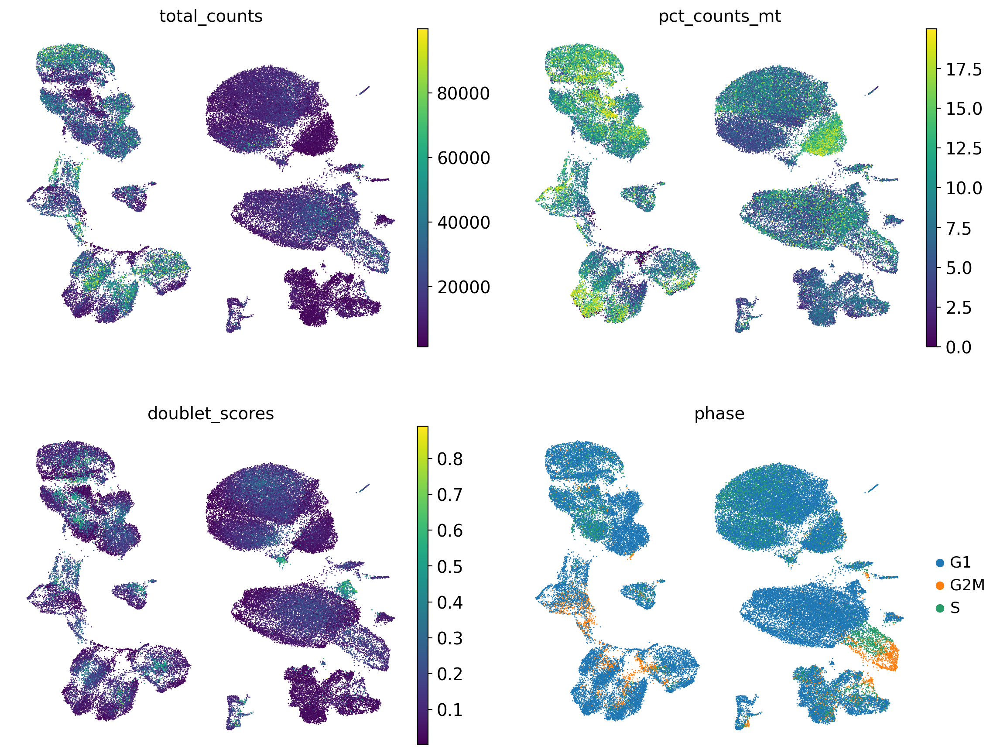

In [23]:
sc.pl.umap(adata_hvg, color=["total_counts", "pct_counts_mt", "doublet_scores", "phase"],
           ncols=2, cmap="viridis", size=4)

# 5. Clustering

> *Find a group (community) of vertices with more edges inside the group than
> edges linking vertices of the group with the rest of the graph.*

You cannot ask Leiden for *n* clusters. You tune the **resolution**, and you change the graph by tuning **k**.

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.1', the cluster labels (adata.obs, categorical) (0:00:04)
11 clusters


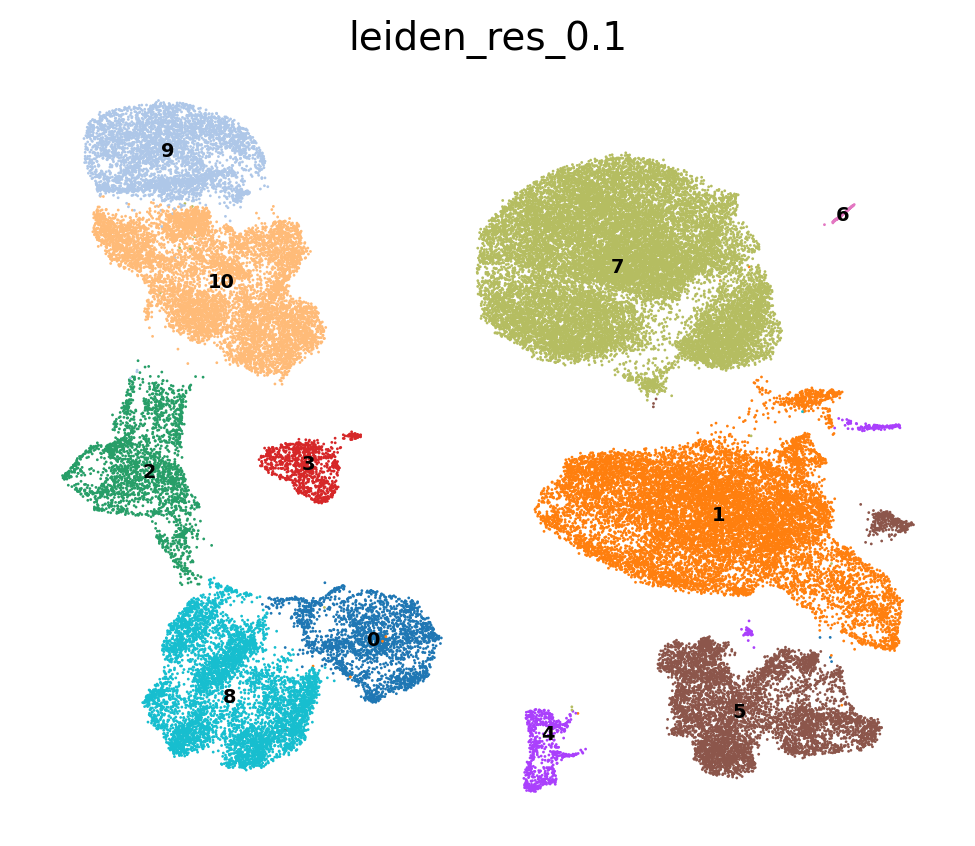

In [24]:
# pick your resolution: start with a low number (likely underclustering) and increase
resolution = 0.1
key = f"leiden_res_{resolution}"
sc.tl.leiden(adata_hvg, resolution=resolution, key_added=key,
             flavor="igraph", n_iterations=2, directed=False)

print(f"{adata_hvg.obs[key].nunique()} clusters")
sc.pl.umap(adata_hvg, color=key, legend_loc="on data", legend_fontsize=7, size=4)

> ### ✏️ Exercise 2 — sweep the resolution
>
> Run Leiden at resolutions **0.1, 0.3, 0.6, 1.0 and 2.0**, each into its own `obs`
> column, and print how many clusters each gives.

<details>
<summary><i>Show solution</i></summary>

```python
for res in [0.1, 0.3, 0.6, 1.0, 2.0]:
    key = f"leiden_res_{res}"
    sc.tl.leiden(adata_hvg, resolution=res, key_added=key,
                 flavor="igraph", n_iterations=2, directed=False)
    print(f"resolution {res:<4} -> {adata_hvg.obs[key].nunique():>3} clusters")

sc.pl.umap(adata_hvg, color=[f"leiden_res_{r}" for r in [0.1, 0.3, 0.6, 1.0, 2.0]],
           legend_loc="on data", legend_fontsize=6, ncols=3, size=4)
```

</details>

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.1', the cluster labels (adata.obs, categorical) (0:00:03)
resolution 0.1  ->  11 clusters
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_res_0.3', the cluster labels (adata.obs, categorical) (0:00:02)
resolution 0.3  ->  16 clusters
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_res_0.6', the cluster labels (adata.obs, categorical) (0:00:03)
resolution 0.6  ->  22 clusters
running Leiden clustering
    finished: found 33 clusters and added
    'leiden_res_1.0', the cluster labels (adata.obs, categorical) (0:00:03)
resolution 1.0  ->  33 clusters
running Leiden clustering
    finished: found 47 clusters and added
    'leiden_res_2.0', the cluster labels (adata.obs, categorical) (0:00:03)
resolution 2.0  ->  47 clusters


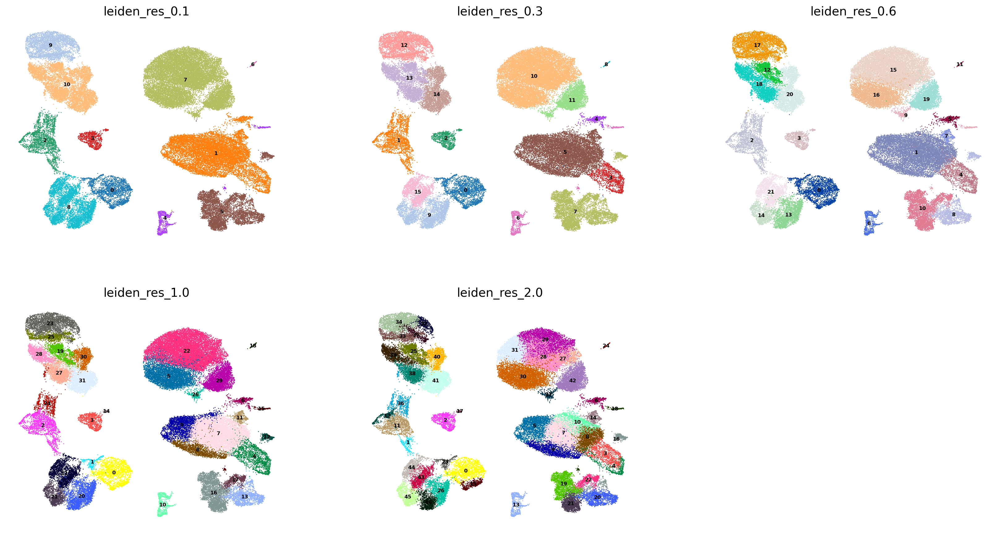

In [25]:
for res in [0.1, 0.3, 0.6, 1.0, 2.0]:
    key = f"leiden_res_{res}"
    sc.tl.leiden(adata_hvg, resolution=res, key_added=key,
                 flavor="igraph", n_iterations=2, directed=False)
    print(f"resolution {res:<4} -> {adata_hvg.obs[key].nunique():>3} clusters")

sc.pl.umap(adata_hvg, color=[f"leiden_res_{r}" for r in [0.1, 0.3, 0.6, 1.0, 2.0]],
           legend_loc="on data", legend_fontsize=6, ncols=3, size=4)

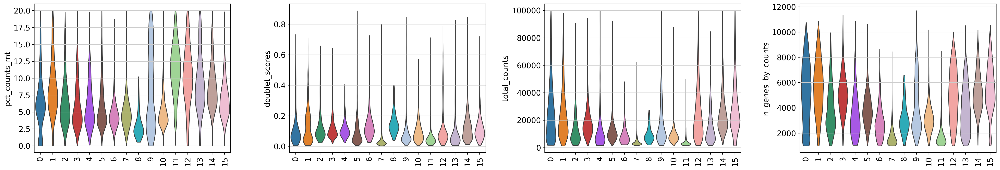

In [26]:
# pick the resolution you want to interrogate and check if certain clusters are just pooling together lowQC cells
RES = "leiden_res_0.3"

covariates = [c for c in ["pct_counts_mt", "doublet_scores",
                          "total_counts", "n_genes_by_counts"]
              if c in adata_hvg.obs.columns]

sc.pl.violin(adata_hvg, covariates, groupby=RES, rotation=90,
             stripplot=False, jitter=False, multi_panel=True)

In [27]:
# Copy over key info to adata
adata.obsm["X_pca"] = adata_hvg.obsm["X_pca"]
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
adata.obs[RES] = adata_hvg.obs[RES]

In [28]:
adata

AnnData object with n_obs × n_vars = 61724 × 30926
    obs: 'n_genes', 'percent_mito', 'doublet_scores', 'senescence_score', 'stress_score_vandenBrink', 'health_score', 'metabolic_activity', 'S_score', 'G2M_score', 'phase', 'sample', 'dataset', 'in_HCAv1', 'exclusion-inclusion_criteria', 'Organ', 'Dataset', 'Sample_id', 'Library_id', 'Donor_id', 'Sex', 'Postnatal_age_years', 'Gestational_age_pcw', 'Developmental_stage', 'Tanner Stage', 'Menstrual_stage', 'Disease', 'Clinical_diagnosis', 'Organ_part', 'Tissue_ROI', 'Specimen_type', 'Sampled_site_condition', 'Observed_pathology', 'Tissue_status', 'Dissociation_method', 'Cell_enrichment', 'Preservation_method', 'Target_cell_population', 'Sorting_method', 'Assay_type', 'Library_chemistry', 'Sequencing_platform', 'Multiplexed', 'Dataset_id', 'Batch', 'Collection_site', 'Sample_id_other', 'Menstrual_stage_OriginalAuthors', 'pct_genes_expressed', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts

In [29]:
print(f"{adata.__sizeof__(with_disk=True) / 1e9:.2f} GB")

3.69 GB


# 6. Cell type annotation

> *Clustering is a hypothesis we need to defend, not a finding in itself.*


markers found for: ['Epithelial', 'Secretory epi', 'Ciliated epi', 'Stromal', 'Endothelial', 'Perivascular', 'Lymphoid', 'Myeloid', 'B / plasma', 'Proliferating']
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.3']`
categories: 0, 1, 2, etc.
var_group_labels: Epithelial, Secretory epi, Ciliated epi, etc.


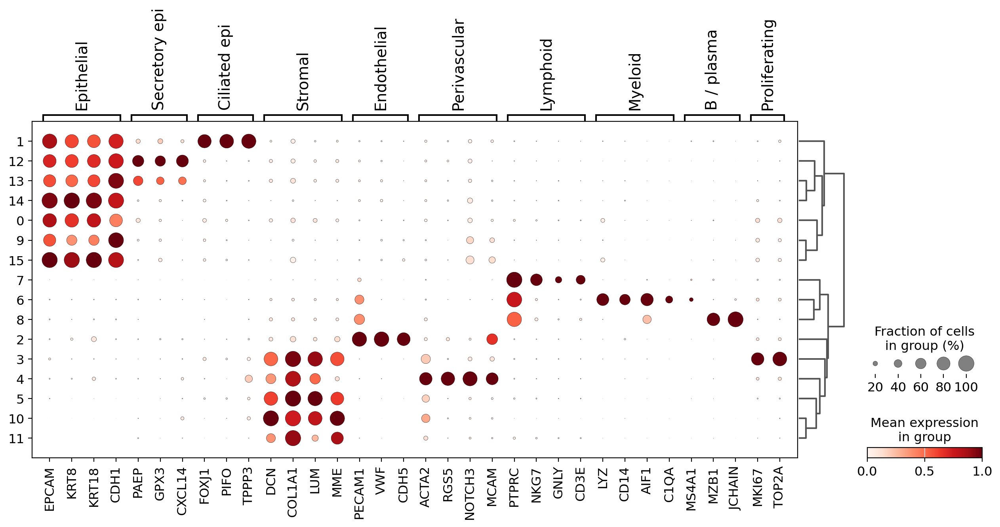

In [30]:
# these are some useful markers, but if you know more by all means use them!
markers = {
    "Epithelial":    ["EPCAM", "KRT8", "KRT18", "CDH1"],
    "Secretory epi": ["PAEP", "GPX3", "CXCL14"],
    "Ciliated epi":  ["FOXJ1", "PIFO", "TPPP3"],
    "Stromal":       ["DCN", "COL1A1", "LUM", "MME"],
    "Endothelial":   ["PECAM1", "VWF", "CDH5"],
    "Perivascular":  ["ACTA2", "RGS5", "NOTCH3", "MCAM"],
    "Lymphoid":     ["PTPRC", "NKG7", "GNLY", "CD3E"],
    "Myeloid":       ["LYZ", "CD14", "AIF1", "C1QA"],
    "B / plasma":    ["MS4A1", "MZB1", "JCHAIN"],
    "Proliferating": ["MKI67", "TOP2A"],
}
markers = {k: [g for g in v if g in adata.var_names] for k, v in markers.items()}
markers = {k: v for k, v in markers.items() if v}
print("markers found for:", list(markers))

sc.pl.dotplot(adata, markers, groupby=RES, 
              standard_scale="var", dendrogram=True)

> ### ✏️ Exercise 3 — name clusters (to the best of your ability!)
>
> Build a dictionary, and map it onto a new `obs` column:
>
> ```python
> labels = {"0": "Stromal", "1": "Epithelial", ...}
> adata.obs["my_annotation"] = adata.obs[RES].map(labels)
> ```
>
> Then plot it on the UMAP.

# 7. Batch effects — do we need to integrate?

> *Always colour the UMAP by the relevant covariates before you decide how to proceed with correcting batch effects.*

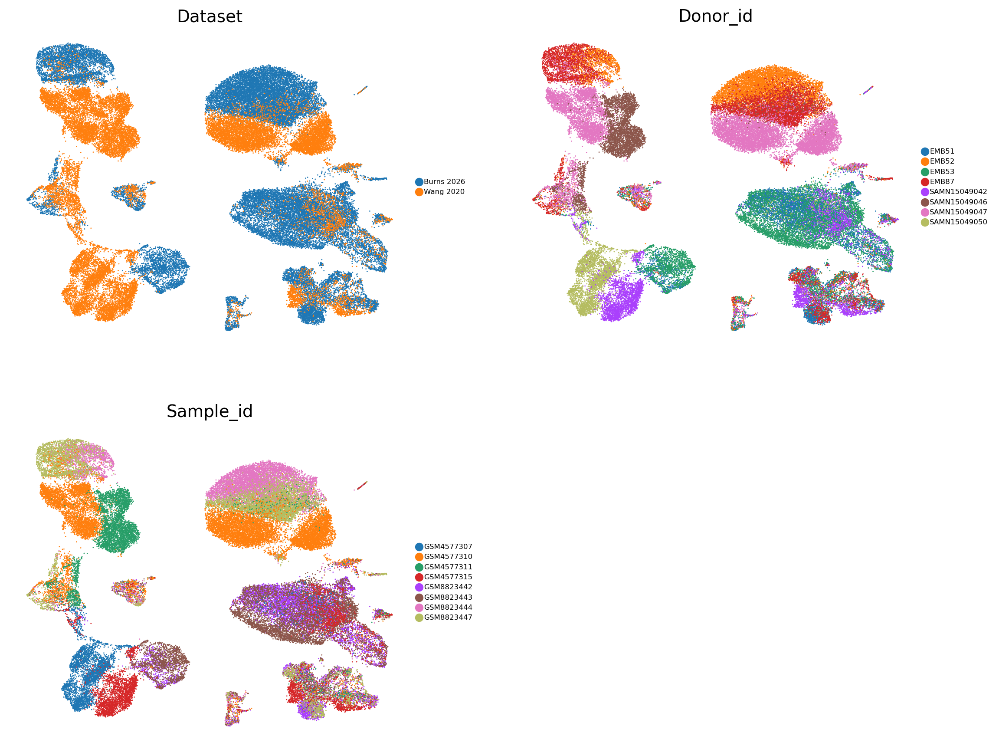

In [31]:
sc.pl.umap(adata, color=["Dataset", "Donor_id", "Sample_id"], ncols=2,
           legend_fontsize=6, size=4)

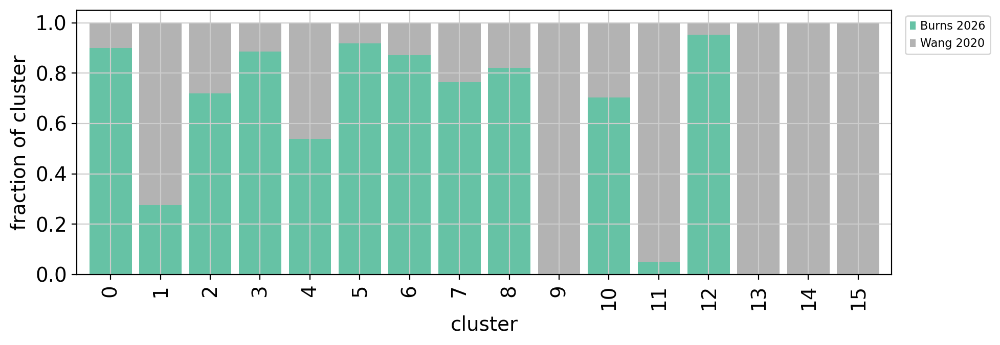

In [32]:
# make a barplot to see cluster composition by dataset more clearly
comp = pd.crosstab(adata.obs[RES], adata.obs["Dataset"], normalize="index")

fig, ax = plt.subplots(figsize=(10, 3.6))
comp.plot(kind="bar", stacked=True, ax=ax, width=0.85, colormap="Set2")
ax.set_ylabel("fraction of cluster"); ax.set_xlabel("cluster")
ax.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=8)
plt.tight_layout(); plt.show()

In [41]:
# save object before we perform integration
adata.write(OUT_DIR + "adata_s2part2.h5ad")